
# Model Fitness case study - 

####   Which factors contribute to gym churn ? 

#### Can they be predicted ?

This project is an example of machine learning in action.

Model Fitness, a chain gym, is looking for traits shared by consumers who've churned the service ,
in order to strengthen its market position and improve customer service. 

The purposes of this project is to determine which characteristics predict churn, creating a profile of churn customers, 
examining elements that have the greatest influence on churn rates , and providing findings and suggestions 
which would help to enhance customer service.

For this report, 'churn' would consider as each case where a customer hasn't appeared at the gym in more than a month , 
thus he has most likely abandoned and won't return. 

We have a representative sampling frame of 4000 observations and 15 columns in our set. 

We'll run a binary classification task and choose one model out of two ,that would best matches our predictions.

#### 1. Loading Data

[1.1 Importing Libraries](#opening_data)
   
[1.2 Info & Samples](#info&samples)
   
[1.3 Modifying Columns](#lowering)
   
[1.4 Profile Report](#ProfileReport)
   
[1.5 Processing Duplicates & Missing Values](#dup&miss)
   
[1.6 Step 1: Summary](#summary1)

#### 2. EDA

[2.1 Statistics Overview](#describe)
   
[2.2 Comparing Feature Means.](#groupby)
   
[2.3 Comparing Feature Distributions: Churned Vs. Non-churned](#bar)
   
[2.4 Correlation Matrix](#cormatrix)
   
[2.5 Step 2: Summary](#summary2)

#### 3. Predicting Churn

[3.1 Dividing the data: train & validation](#train)
   
[3.2 logistic Regression](#logisticregression)
   
[3.3 RandomForest](#forest)
   
[3.4 Evaluating Accuracy, Precision & Recall](#Evaluate)

#### 4. User Clusters

[4.1 Standardize Data.](#clusters)
   
[4.2 Dendogram](#clusters)
   
[4.3 Training by K-means Algorithm](#meanfea)
   
[4.4 Analyzing Feature Means](#eye)
   
[4.5 Feature Distributations](#plot)

#### 5. Conclusions & Recommendations

[5.1 Conclusions](#step5)

#### 1. Loading data

In [5]:
import pandas as pd
import plotly.express as px
%matplotlib inline
import statistics
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
df = sns.load_dataset("penguins")
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans

In [6]:
try:
    gym = pd.read_csv('/datasests/gym_churn_us.csv')
except:
    gym = pd.read_csv('/Users/ohayo/Desktop/Forecasts & Prediction Project/gym_churn_us.csv')
    print('working locally')
    print('Forecast and Prediction Project')

working locally
Forecast and Prediction Project


<a id="info&samples"></a>

#### Info & Samples

In [4]:
display("Info:")
display(gym.info(memory_usage='deep'))

display("Data head")
display(gym.head(5))

display("Data tail")
display(gym.tail(5))

gym['id'] = gym.index + 1

display("Sample")
display(gym.sample())

display("Data size:")
display(gym.shape)

'Info:'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             4000 non-null   int64  
 1   Near_Location                      4000 non-null   int64  
 2   Partner                            4000 non-null   int64  
 3   Promo_friends                      4000 non-null   int64  
 4   Phone                              4000 non-null   int64  
 5   Contract_period                    4000 non-null   int64  
 6   Group_visits                       4000 non-null   int64  
 7   Age                                4000 non-null   int64  
 8   Avg_additional_charges_total       4000 non-null   float64
 9   Month_to_end_contract              4000 non-null   float64
 10  Lifetime                           4000 non-null   int64  
 11  Avg_class_frequency_total          4000 non-null   float

None

'Data head'

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
0,1,1,1,1,0,6,1,29,14.227470,5.0,3,0.020398,0.000000,0
1,0,1,0,0,1,12,1,31,113.202938,12.0,7,1.922936,1.910244,0
2,0,1,1,0,1,1,0,28,129.448479,1.0,2,1.859098,1.736502,0
3,0,1,1,1,1,12,1,33,62.669863,12.0,2,3.205633,3.357215,0
4,1,1,1,1,1,1,0,26,198.362265,1.0,3,1.113884,1.120078,0


'Data tail'

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn
3995,1,1,1,0,1,12,0,33,2.406023,12.0,8,2.284497,2.349070,0
3996,0,1,0,0,1,1,1,29,68.883764,1.0,1,1.277168,0.292859,1
3997,1,1,1,1,1,12,0,28,78.250542,11.0,2,2.786146,2.831439,0
3998,0,1,1,1,1,6,0,32,61.912657,5.0,3,1.630108,1.596237,0
3999,1,0,1,0,0,12,1,30,178.861814,12.0,1,1.101832,1.035270,0


'Sample'

,gender,Near_Location,Partner,Promo_friends,Phone,Contract_period,Group_visits,Age,Avg_additional_charges_total,Month_to_end_contract,Lifetime,Avg_class_frequency_total,Avg_class_frequency_current_month,Churn,id
2308,1,1,0,0,1,1,0,21,124.821854,1.0,1,1.681779,1.195885,1,2309


'Data size:'

(4000, 15)

<a id="lowering"></a>

#### Modifying Columns Names

In [19]:
# Lowering case columns names
gym.columns = gym.columns.str.lower()

<a id="ProfileReport"></a>

#### Profile Raport

In [20]:
from pandas_profiling import ProfileReport

profile = ProfileReport(gym, title='Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id="dup&miss"></a>

#### Processing Duplicates & Missing Values

In [21]:
print('duplicates:')
gym.duplicated().sum()

duplicates:


0

In [22]:
display("missing values:", gym.isnull().sum())

'missing values:'

gender                               0
near_location                        0
partner                              0
promo_friends                        0
phone                                0
contract_period                      0
group_visits                         0
age                                  0
avg_additional_charges_total         0
month_to_end_contract                0
lifetime                             0
avg_class_frequency_total            0
avg_class_frequency_current_month    0
churn                                0
dtype: int64

<a id="summary1"></a>

### Step 1: Summary:

The dataset contains **4,000 observations & 14 columns**.

converted columns names to **Lower case** as a regular work routine and for the sake of convinience.

there wasn't any **missing values nor duplicates** 

The user id's are missing so instead we'll use indexes. 


The overview of the profile report indicates the presence of 8 categorical variables and 7 numerical variables
in our dataset. 

Additionally, by referring to the "alerts" tab, we can identify the variables that exhibit high correlation:

   'month_to_end_contract' is **highly correlated** with "contract_period", and vice versa.
   
   'avg_class_frequency_total' is **highly correlated** with "avg_class_frequency_current_month', and vice versa.
   
   'avg_class_frequency_current_month' is **highly correlated** with 'churn', and vice versa.
   
   'lifetime' is **highly correlated** with 'churn', and vice versa.
   
   'age' is **highly correlated** with 'churn', and vice versa.
   
   'partner' is **highly correlated** with 'promo friends', and vice versa.
   
   'churn' is **highly correlated** with 'month_to_end_contract', and vice versa.

We can also see that we don't have customers who'd signed for 3 months contracts.

'Lifetime', 'avg_class_frequency_current_month' & 'avg_class_frequency_total' contain **zeros**.
However, These aren't missing values, but real zeros that correspond to the measurement scale of the variables 
(For example, a value of 0 in the lifetime variable probably describes a new subscription).

We do have some **Boolean variables** that contain zeros: 'gender', 'near_location', 'partner', 'promo_friends', 'phone', 'group_visits' and 'churn'.

In [23]:
gym.head(5)

,gender,near_location,partner,promo_friends,phone,contract_period,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_total,avg_class_frequency_current_month,churn
0,1,1,1,1,0,6,1,29,14.227470,5.0,3,0.020398,0.000000,0
1,0,1,0,0,1,12,1,31,113.202938,12.0,7,1.922936,1.910244,0
2,0,1,1,0,1,1,0,28,129.448479,1.0,2,1.859098,1.736502,0
3,0,1,1,1,1,12,1,33,62.669863,12.0,2,3.205633,3.357215,0
4,1,1,1,1,1,1,0,26,198.362265,1.0,3,1.113884,1.120078,0


#### 2. EDA

#### 2.1 Statistics Overview

<a id="describe"></a>

In [24]:
gym.describe()

,gender,near_location,partner,promo_friends,phone,contract_period,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_total,avg_class_frequency_current_month,churn
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,0.510250,0.845250,0.486750,0.308500,0.903500,4.681250,0.412250,29.184250,146.943728,4.322750,3.724750,1.879020,1.767052,0.265250
std,0.499957,0.361711,0.499887,0.461932,0.295313,4.549706,0.492301,3.258367,96.355602,4.191297,3.749267,0.972245,1.052906,0.441521
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,18.000000,0.148205,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,27.000000,68.868830,1.000000,1.000000,1.180875,0.963003,0.000000
50%,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,29.000000,136.220159,1.000000,3.000000,1.832768,1.719574,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,1.000000,31.000000,210.949625,6.000000,5.000000,2.536078,2.510336,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,1.000000,41.000000,552.590740,12.000000,31.000000,6.023668,6.146783,1.000000


<a id="groupby"></a>

#### Comparing Feature Means

In [27]:
# grouping by 'churn' checking mean values for every feature:

gym_churn = gym.groupby(['churn'])\
['gender', 'near_location', 'partner', 'promo_friends', 'phone', 'contract_period', 
                                   \
 'group_visits', 'age', 'avg_additional_charges_total', 'month_to_end_contract', 'lifetime',
                                   \
 'avg_class_frequency_total',  'avg_class_frequency_current_month'].mean()
gym_churn

,gender,near_location,partner,promo_friends,phone,contract_period,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_total,avg_class_frequency_current_month
churn,,,,,,,,,,,,,
0,0.510037,0.873086,0.534195,0.353522,0.903709,5.747193,0.464103,29.976523,158.445715,5.283089,4.711807,2.024876,2.027882
1,0.510839,0.768143,0.355325,0.183789,0.902922,1.728558,0.268615,26.989632,115.082899,1.662582,0.990575,1.474995,1.044546



   
   #### Preliminary Analysis of Features associated to the Target Variable - Churn:



Although we don't know the subscribers **gender**, we can see that our data is distributed evenly by gender.
we have about 50% males and females in both quiters & stayers.

For **'churn'**: a value of '0' means they still with us , while '1' means they left**.
If we think for a moment about a group of abandoners and imagine the average of the months they have left
until the end of the subscription, We will expect to find a lower number of months than in the 
group of those who remain.
We can tell this by looking on the mean values of 'month_to_end_contract': 
it's 5.28 months for stayers and 1.66 for quiters.
People are more likely to unsubscribe from any service as the contract deadline approaches. 
Therefore, it is more likely that the remaining subscribers are those with a "0" classification,
and with an average of 5.74 months until the end of their contract.

87% of the stayers and 76% of the quiters **lives around**. 
meaning that more people who left are not from the city. There may be cheaper competitors 
in neighboring cities. 

53% of the stayers and 35% of the quiters are employees in **partner** companies and has a discount.
The discounts may play a role in retaining gym members.

35% of our stayers and 18% of our quiters, were signed with their **friends** and recived a promotion discount.

The vast majority of gym members, whether those who stayed or left, gave their **phone number** (90% for each group).

The **contract period** for those who stayed is 5.74 months and 1.72 for those who left.
It is possible that subscribers who'd left, may knew from advance they intend to leave , and therefore
signed up for short subscription periods.

46% of stayers tend to participate **group calsses**, while only 27% for those who left.
It is possible that the degree of involvement or socialization of the subscriber with the gym is related to its 
retention as a subscriber.

Stayers average **age** is 30 & 27 for quiters.

The **average additional charges** for stayers is almost 160$ while for quiters is about 115$.
The more time a member spends at the gym, the more money they'll spend on drinking , eating & clothing.

**Month to end contract** for stayers is 5.2 and 1.6 for quiters.

**Avg calss frequency total** is 2 for stayers and 1.5 for quiters.
The client's involvement in the activities of the gym may express his attitude towards the institution / business ,
or the degree of commitment to the his personal process of maintaining a healthy lifestyle.

**Avg class frequency current month** is 2 for stayers which means they went to average of 2 practicies a week in the last month, while leavers went to an average of 1 pratice a week this month, this is another sign for someone which is not really into our gym, coming to 1 or less practice a week is a weak connection.



#### Comparing Feature Distributions - Churned vs. No-Churned

<a id="bar"></a>

For those who stayed:


<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

Text(0.5, 1.0, 'gender')

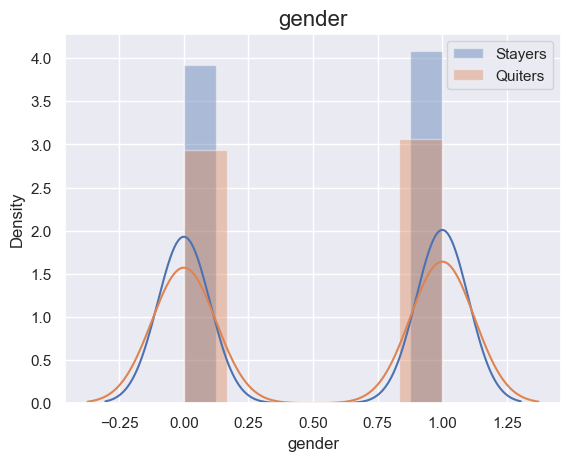

<AxesSubplot: xlabel='near_location', ylabel='Density'>

<AxesSubplot: xlabel='near_location', ylabel='Density'>

Text(0.5, 1.0, 'near_location')

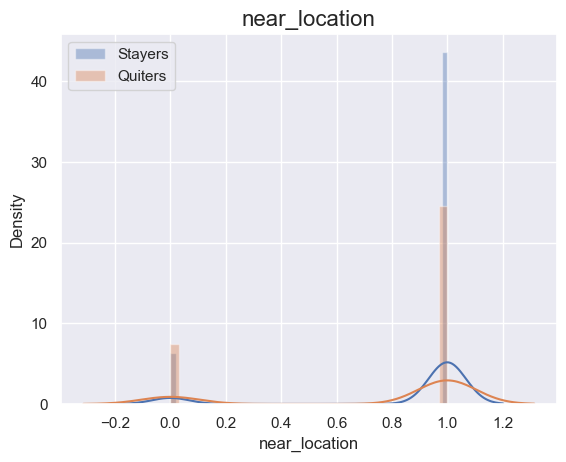

<AxesSubplot: xlabel='partner', ylabel='Density'>

<AxesSubplot: xlabel='partner', ylabel='Density'>

Text(0.5, 1.0, 'partner')

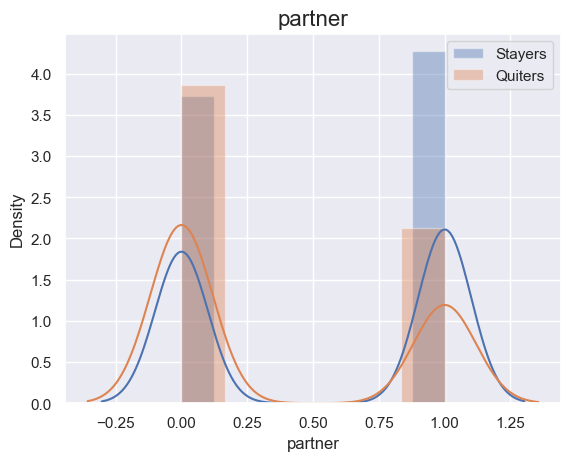

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

Text(0.5, 1.0, 'promo_friends')

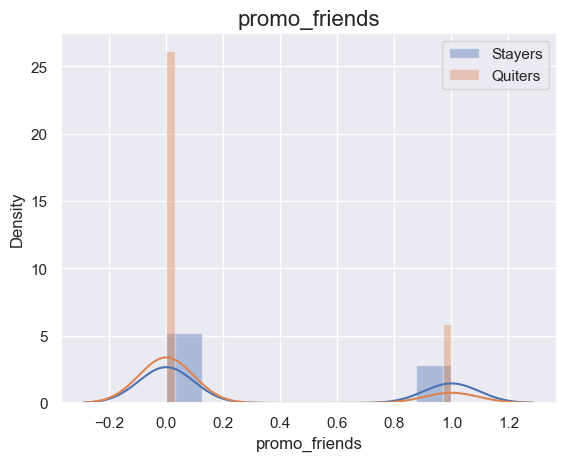

<AxesSubplot: xlabel='phone', ylabel='Density'>

<AxesSubplot: xlabel='phone', ylabel='Density'>

Text(0.5, 1.0, 'phone')

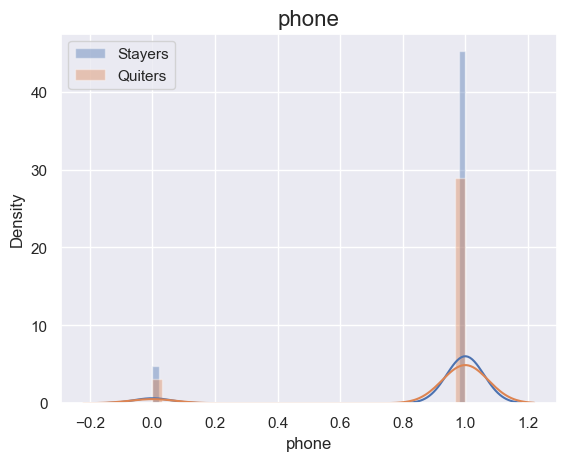

<AxesSubplot: xlabel='contract_period', ylabel='Density'>

<AxesSubplot: xlabel='contract_period', ylabel='Density'>

Text(0.5, 1.0, 'contract_period')

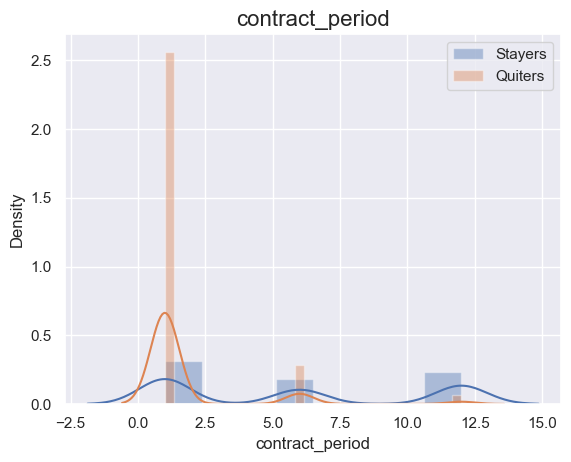

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

Text(0.5, 1.0, 'group_visits')

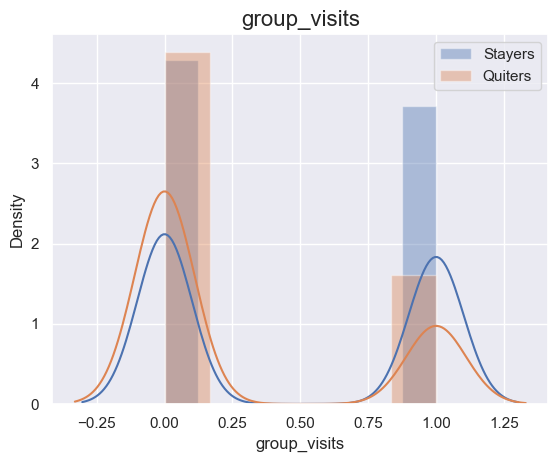

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

Text(0.5, 1.0, 'age')

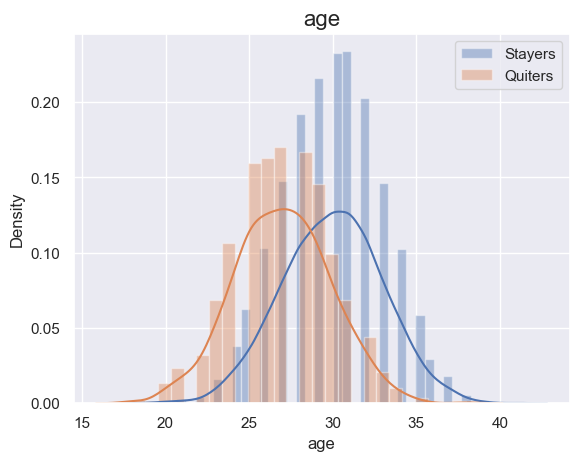

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

Text(0.5, 1.0, 'avg_additional_charges_total')

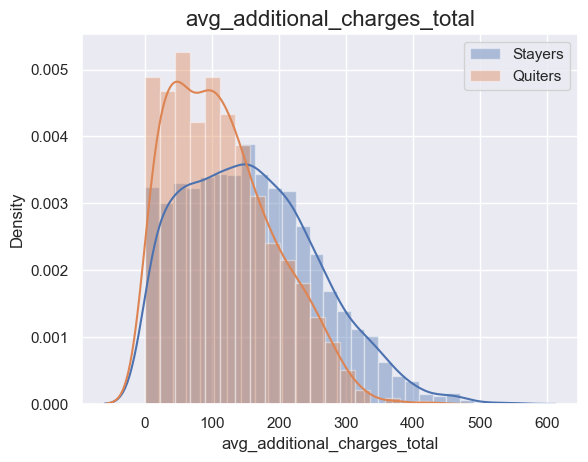

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

Text(0.5, 1.0, 'month_to_end_contract')

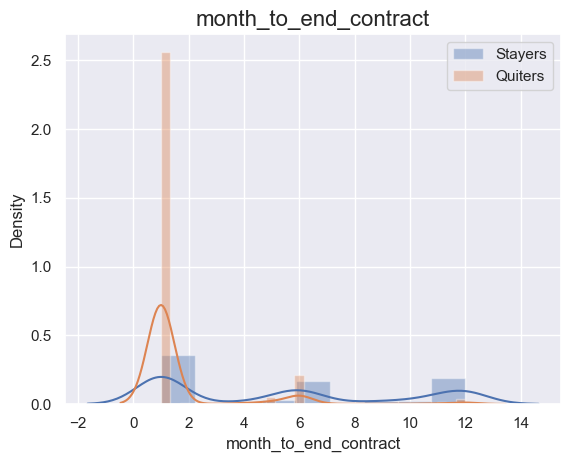

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

Text(0.5, 1.0, 'lifetime')

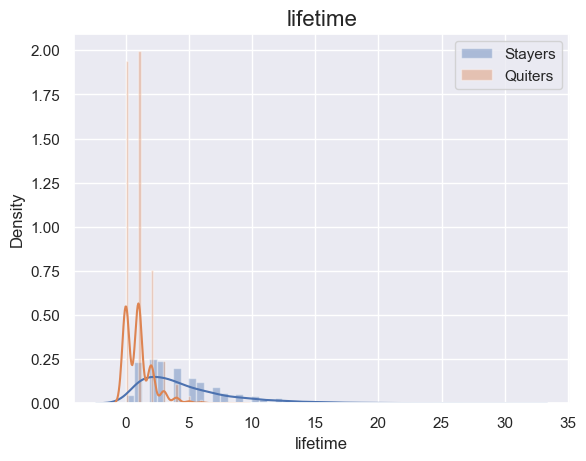

<AxesSubplot: xlabel='avg_class_frequency_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_total', ylabel='Density'>

Text(0.5, 1.0, 'avg_class_frequency_total')

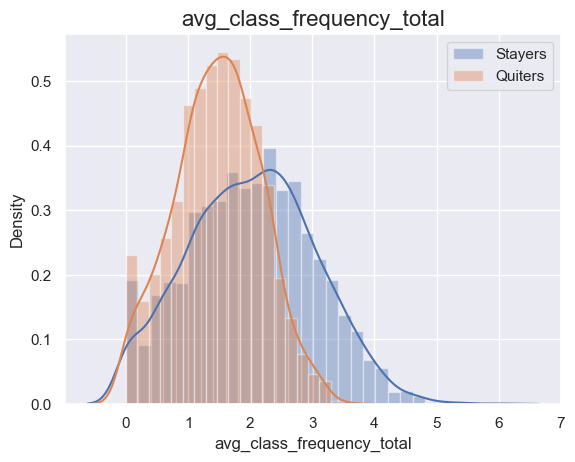

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

Text(0.5, 1.0, 'avg_class_frequency_current_month')

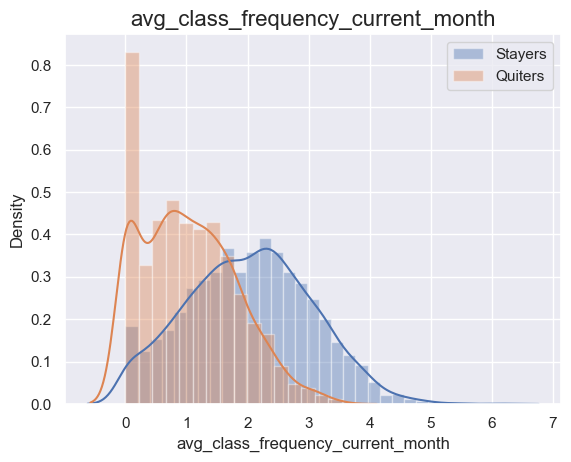

In [31]:
# creating 2 groups of churn - 'stayers' and 'quiters'

gym_stayers = gym.loc[gym['churn'] == 0]
gym_quiters = gym.loc[gym['churn'] == 1]

# by using a simple 'for' loop, sns.displot would 'run' threw each column and plot distribution:

print('For those who stayed:')
for col in gym.drop(['churn'], axis=1).columns: # dropping 'churn' as distinguished target variable
    sns.distplot(gym_stayers[col], label='Stayers')
    sns.distplot(gym_quiters[col], label='Quiters')
    plt.title(col, fontsize=16)
    plt.legend()
    plt.show()

In [32]:
# Exploring gender indicies:

gym_male = gym.loc[gym['gender'] == 1]
gym_female = gym.loc[gym['gender'] == 0]
print('number of Males/Females in the first group:')
display(gym_male.shape)
print('number of Males/Females in the second group:')
display(gym_female.shape)
display(gym.contract_period.describe())

number of Males/Females in the first group:


(2041, 14)

number of Males/Females in the second group:


(1959, 14)

count    4000.000000
mean        4.681250
std         4.549706
min         1.000000
25%         1.000000
50%         1.000000
75%         6.000000
max        12.000000
Name: contract_period, dtype: float64

#### Correleation Matrix

<a id="cormatrix"></a>

<AxesSubplot: >

(15.0, 0.0)

Text(0.5, 1.0, 'Correlation Matrix')

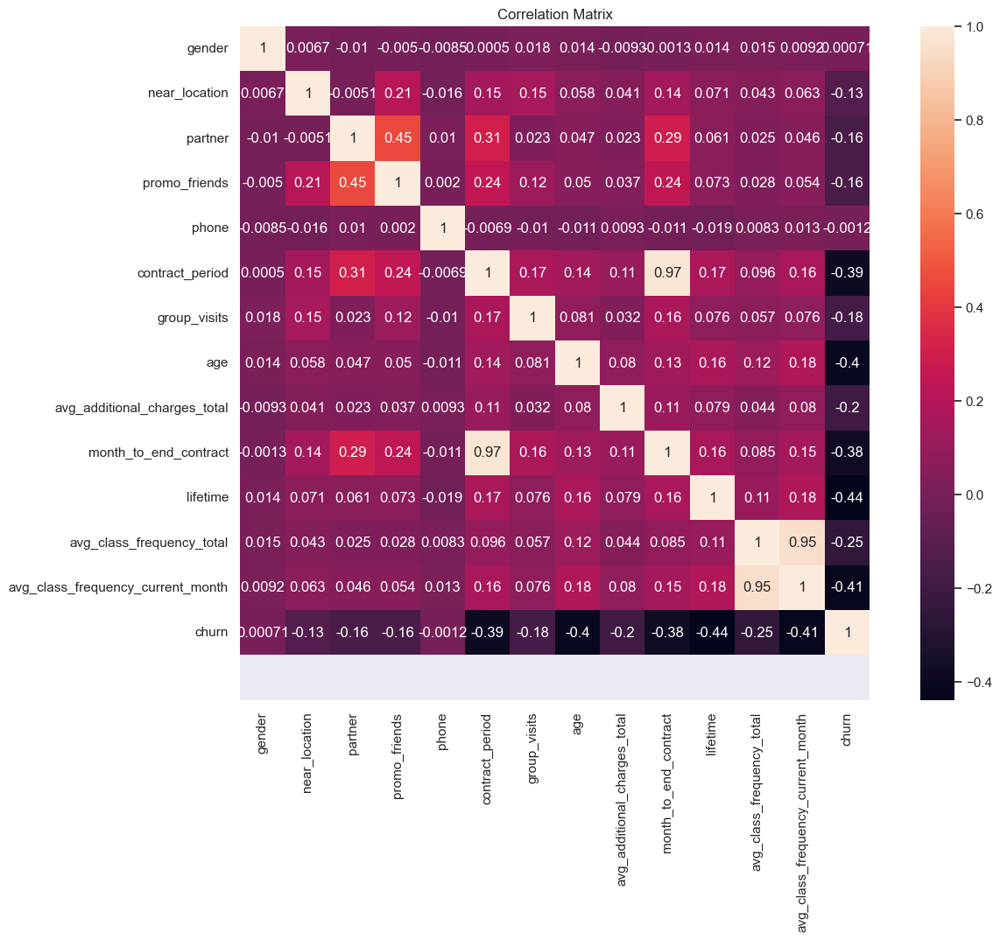

In [33]:
cm = gym.corr()
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(cm, annot = True, square = True)
ax.set_ylim(15, 0)
plt.title('Correlation Matrix')

### 2. Summary

**Gender**

Gender is a normally distributed variable, therefore it seems reasonable that men and women have normal distributions with the average, median, and mode on the axis of symmetry. One group has a slightly higher curve, but we don't know if it's men or women. One group has 82 more observations than another, or 2%.

**Near location** 

1 value in "near location" describe clients that live nearby.
The near location curve shows two distinct curves.
Since most people choose a local gym, one of the curves makes sense.
Whether they left or stayed, most clients live near the gym.

**Partner**

Most clients who left didn't obtain a registration discount as employees of a partner company.
yet, most of the remaning clients benefits by this discount.

**Promo Friends**

Customers who left without a friend-of-a-friend discount are obvious. Most clients who left didn't obtain a member discount on registration.

**Phone**

We can see that most customers have left their phone number, whether they left or stayed.

**Contract Period**

Most gym dropouts had 3-month contracts when they joined. The contract period curve appears like a wave that diminishes as the subscriber's contract lengthens. Longer contracts make subscribers less likely to depart.

**Group Visits**

Most of the people who left didn't participate group classes.

**Age**

Normal distributions are expected for population variables like age. Similarly, older subscribers are less likely to depart. Leavers are younger than stayers.

**Avg. Additional Charges Total**

Quitters have a right-skewed purchasing curve.
The mode is higher than the mean & median:   217.78
Most gym-dropouts spend less money.

The average purchasing curve isn't distorted for the remaining clients.
Median value is 149.88 , the mode is 14.22 & the mean is 158.44, showing they spend more.

**Month To End Contract**

Abandoned customers have one month left on their contracts. Most clients quit with less than two months remaining. Six months before the contract's expiration, some customers leave.

**Lifetime**

Most abandoned clients aren't long-term. Most clients who left did so within 3 months of registering.

**Avg. Class Frequency Total**

Quiters average 1.47 weekly sessions, while stayers average is 2.02 .

**Avg Class Frequency Current Month**

Quiters average on monthly sessions is 1.00 ,  while for stayers is 2.02 .

**Correlation Matrix**

Contract period & month to end contract are highly correlated. 
Second, avg class frequency total & avg class frequency Current Month.

We'll need 2 feature reductions between these two pairings in order to avoid bias.

#### 3. Predicting Churn

<a id="train"></a>

#### Dividing The Data: train & validation sets

In [34]:
# Reducing features that are highly correlated

gym_nc = gym.drop(['avg_class_frequency_total', 'contract_period'], axis=1)
gym_nc.head(5)

,gender,near_location,partner,promo_friends,phone,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_current_month,churn
0,1,1,1,1,0,1,29,14.227470,5.0,3,0.000000,0
1,0,1,0,0,1,1,31,113.202938,12.0,7,1.910244,0
2,0,1,1,0,1,0,28,129.448479,1.0,2,1.736502,0
3,0,1,1,1,1,1,33,62.669863,12.0,2,3.357215,0
4,1,1,1,1,1,0,26,198.362265,1.0,3,1.120078,0


In [35]:
# Defining 'churn' as y and features as X:

X = gym_nc.drop('churn', axis=1)
y = gym_nc['churn']

# Deviding the data into train and validation sets:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

scaler = StandardScaler() # creating a scaler class object

scaler.fit(X_train) # training standardizer

X_train_st = scaler.transform(X_train) # transforming the train data set 

X_test_st = scaler.transform(X_test) # # transforming the validation data set 

StandardScaler()

<a id="logisticregression"></a>

#### Training By Logistic Regression

In [37]:
# training the train-set by using LogisticRegression

model_1 = LogisticRegression(random_state=0, solver = 'newton-cg')

model_1.fit(X, y) # training the model

predictions_1 = model_1.predict(X_test) # binary prediction

probabilities_1 = model_1.predict_proba(X_test)[:,1] # using the trained model to make forecasts

# creating mape function

def mape(y_test, y_pred):
    '''
    this function will calculate the mape error
    '''
    y_error =  y_test - y_pred
    y_error_abs = [abs(i) for i in y_error]
    perc_error_abs = y_error_abs / y_test
    mape = (perc_error_abs.sum() / len(y_test))
    return mape

# creating metrics function

def metrics_printer(y_true, y_pred, y_proba, title='Metrics'):
    '''
    this function will print all metrics we need for making a comparsion between the two models
    '''
    print(title)
    print('\tAccuracy: {:.2f}'.format(accuracy_score(y_true, y_pred)))
    print('\tPrecision: {:.2f}'.format(precision_score(y_true, y_pred)))
    print('\tRecall: {:.2f}'.format(recall_score(y_true, y_pred)))
    print('\tF1: {:.2f}'.format(f1_score(y_true, y_pred)))
    print('\tROC_AUC: {:.2f}'.format(roc_auc_score(y_true, y_proba)))
    print('\tMAE:{:.2f} MSE:{:.2f} MAPE:{:.2f} R2:{:.2f}'.format(mean_absolute_error(y_true, y_pred), mean_squared_error(y_true, y_pred), mape(y_true, y_pred), r2_score(y_true, y_pred)))
    
metrics_printer(y_test, predictions_1, probabilities_1, title='Metrics for automatic prediction made with predict for logistic regression')

threshold = 0.361 # setting the threshold: the share of users with churn=1 / users with churn=0

# calculating predictions on the basis of ratio between classes

custom_predictions = [0 if i<threshold else 1 for i in probabilities_1]

print()

# printing all metrics for predictions with new threshold

metrics_printer(y_test, custom_predictions, probabilities_1, title='Metrics for the prediction with custom threshold for logistic regression')

weight_0 = model_1.intercept_ # null coefficient
feature_weights0 = model_1.coef_


print('weight_0:', weight_0)
print()
print('feature_weights:', feature_weights0)

LogisticRegression(random_state=0, solver='newton-cg')

Metrics for automatic prediction made with predict for logistic regression
	Accuracy: 0.91
	Precision: 0.81
	Recall: 0.81
	F1: 0.81
	ROC_AUC: 0.96
	MAE:0.10 MSE:0.10 MAPE:inf R2:0.49

Metrics for the prediction with custom threshold for logistic regression
	Accuracy: 0.90
	Precision: 0.75
	Recall: 0.87
	F1: 0.81
	ROC_AUC: 0.96
	MAE:0.10 MSE:0.10 MAPE:inf R2:0.45
weight_0: [15.99088622]

feature_weights: [[ 0.07441666 -0.19880147 -0.17063017 -0.45008591 -0.24502692 -0.8135491
  -0.36526613 -0.00588018 -0.3303658  -1.04159208 -1.23868329]]


In [17]:
# checking each group size

gym_left = gym.loc[gym['churn'] == 1]
gym_stay = gym.loc[gym['churn'] == 0]

print(gym_left.shape)
print(gym_stay.shape)

(1061, 15)
(2939, 15)


**we see that by using the threshold of  the share of customers in group '1' of churn, we manage to improve recall by 0.05.**

**At the same time, accurarcy and precision decreased slightly in value (accurarcy by 0.01, precision by 0.04).**

#### Training By RandomForest

<a id="forest"></a>

In [38]:
# define the 2nd model's algorithem as Decision Tree

rf_model = RandomForestClassifier(n_estimators = 100, random_state = 0)

# training the random forest model

rf_model.fit(X_train_st, y_train)

# making predictions based on trained model

rf_predictions = rf_model.predict(X_test_st)

rf_probabilities = rf_model.predict_proba(X_test_st)[:,1]

# print all metrics

metrics_printer(y_test, rf_predictions, rf_probabilities, title='Metrics for Random Forest:')

print()

feature_wights2 = rf_model.feature_importances_ # analyzing features importances

print('feature importance:', feature_wights2)

RandomForestClassifier(random_state=0)

Metrics for Random Forest:
	Accuracy: 0.91
	Precision: 0.82
	Recall: 0.78
	F1: 0.80
	ROC_AUC: 0.95
	MAE:0.10 MSE:0.10 MAPE:inf R2:0.49

feature importance: [0.01572324 0.01190245 0.01595449 0.01603309 0.00816518 0.0198219
 0.13987297 0.12459099 0.1166195  0.32161448 0.2097017 ]


In [39]:
print(classification_report(y_test, rf_predictions))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       602
           1       0.82      0.78      0.80       198

    accuracy                           0.91       800
   macro avg       0.88      0.86      0.87       800
weighted avg       0.90      0.91      0.90       800



<a id="Evaluate"></a>

In [40]:
print(classification_report(y_test, predictions_1))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94       602
           1       0.81      0.81      0.81       198

    accuracy                           0.91       800
   macro avg       0.87      0.87      0.87       800
weighted avg       0.91      0.91      0.91       800



#### Evaluating Accuracy, Precision & Recall

**Accurarcy:** Random forest: 0.9 , LogisticRegression: 0.90/0.91 (the share of accurate predictions among all observations)

**Precision** Random Forest: 0.82, LogisticRegression: 0.76/0.8 (the share of correct predictions among the target class)

**Recall:** Random Forest: 0.76 , LogisticRegression: 0.82/0.87 (the share of real objects that has been
predicted in the target class.)

It seems that **the leading model is the logisticRegression**. Since the data classes are not evenly balanced (50/50), we can't reley on Accurarcy alone, althogh it's pretty high for both of our models.

Precision taking into acount the share of correct positive prediction out of true positive answers. meaning ,how well did our model manage to predict 'churn', which is the trget varible in question. 
however, it dosn't taking into accont the wrong classes that our model might have been missing.
Precision is basically asking: how completly our model finds the correct label in question. it's taking into account the amount of true-positive cases and divide it by the sum of true positive cases + false negative cases. there is a trade-off between the two maesures.

taking into acoount **F1 score**, which defines as the hramonic mean between precision and recall. 
(meaning - how good is the quality of the predictions made by the model? how completly our model manage to predict 'churn' based on the data-set?)
the F1 score is higher in LogisticRegression: 0.81. therefore, LogisticRegression is our leading model. 



#### 4.User Clusters

<a id="clusters"></a>

#### Standardize Data

In [43]:
sc = StandardScaler() # creating a scaler class object(normalized)
x_sc = sc.fit_transform(X) # training & transforming the data-set

print(x_sc[:3])

[[ 0.97970588  0.42788074  1.02686062  1.49716101 -3.05985201  1.19403206
  -0.0565538  -1.37753121  0.16160501 -0.19332863 -1.67847198]
 [-1.0207145   0.42788074 -0.973842   -0.66793083  0.32681319  1.19403206
   0.55732732 -0.35021325  1.83194105  0.87368001  0.1360137 ]
 [-1.0207145   0.42788074  1.02686062 -0.66793083  0.32681319 -0.83749845
  -0.36349436 -0.1815923  -0.79287273 -0.46008079 -0.02901851]]


#### Dendrogram

<Figure size 1500x1000 with 0 Axes>

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [5.0, 5.0, 20.0, 20.0],
  [45.0, 45.0, 55.0, 55.0],
  [35.0, 35.0, 50.0, 50.0],
  [12.5, 12.5, 42.5, 42.5],
  [65.0, 65.0, 75.0, 75.0],
  [85.0, 85.0, 95.0, 95.0],
  [105.0, 105.0, 115.0, 115.0],
  [90.0, 90.0, 110.0, 110.0],
  [70.0, 70.0, 100.0, 100.0],
  [135.0, 135.0, 145.0, 145.0],
  [125.0, 125.0, 140.0, 140.0],
  [85.0, 85.0, 132.5, 132.5],
  [27.5, 27.5, 108.75, 108.75],
  [155.0, 155.0, 165.0, 165.0],
  [205.0, 205.0, 215.0, 215.0],
  [195.0, 195.0, 210.0, 210.0],
  [185.0, 185.0, 202.5, 202.5],
  [175.0, 175.0, 193.75, 193.75],
  [160.0, 160.0, 184.375, 184.375],
  [225.0, 225.0, 235.0, 235.0],
  [255.0, 255.0, 265.0, 265.0],
  [245.0, 245.0, 260.0, 260.0],
  [230.0, 230.0, 252.5, 252.5],
  [285.0, 285.0, 295.0, 295.0],
  [275.0, 275.0, 290.0, 290.0],
  [241.25, 241.25, 282.5, 282.5],
  [305.0, 305.0, 315.0, 315.0],
  [325.0, 325.0, 335.0, 335.0],
  [345.0, 345.0, 355.0, 355.0],
  [330.0, 330.0, 350.0, 350.0],
  [310.0, 310.0, 340.0, 34

Text(0.5, 1.0, 'Heirarchial clustering for gym')

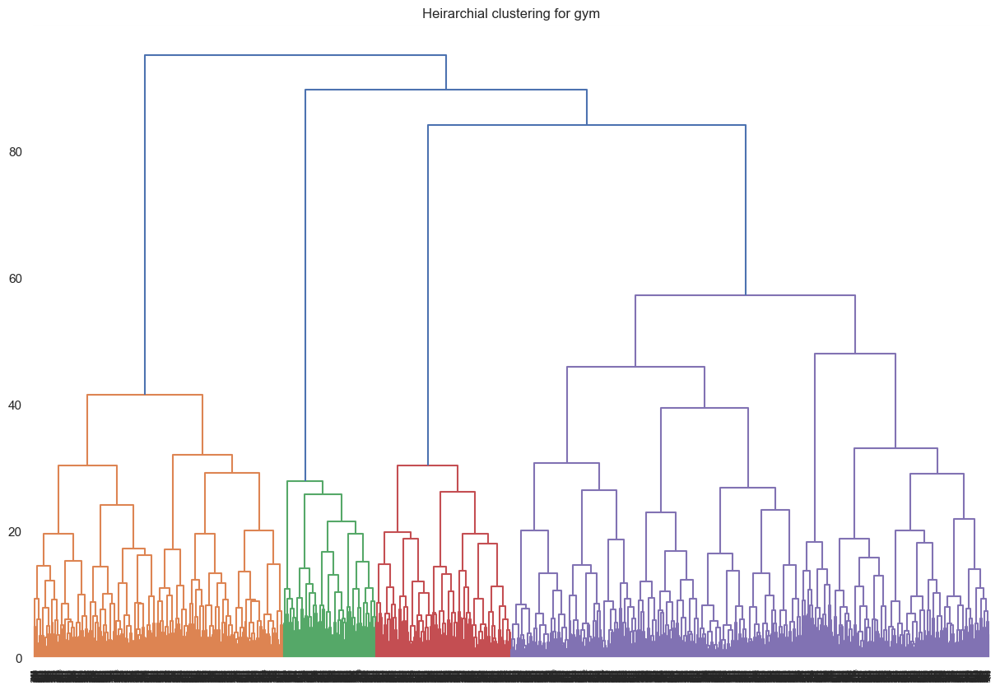

In [46]:
linked = linkage(x_sc, method = 'ward') # matrix of distances

plt.figure(figsize=(15, 10))
dendrogram(linked, orientation='top') # creating dendrogram
plt.title('Heirarchial clustering for gym')
plt.show()

#### we have 4 clusters

<a id="meanfea"></a>

#### Training By using K-means algorithem

In [47]:
# a function for rendering graphs of paired features for the clusters

def show_cluster_on_plot(df, x_name, y_name, cluster_name):
    plt.figure(figsize = (10, 10))
    sns.scatterplot(df[x_name], df[y_name], hue = df[cluster_name], palette = 'Paired')
    plt.title('{} vs {}'.format(x_name, y_name))
    
km = KMeans(n_clusters = 5, random_state = 0) # applying KMmeans, setting the number of clusters as 5
labels = km.fit_predict(x_sc) # applaying the algorithm to the data and forming a cluster vector

gym_nc['cluster_num'] = labels # storing clusters labels into a feild

gym_nc.head()

,gender,near_location,partner,promo_friends,phone,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_current_month,churn,cluster_num
0,1,1,1,1,0,1,29,14.227470,5.0,3,0.000000,0,0
1,0,1,0,0,1,1,31,113.202938,12.0,7,1.910244,0,4
2,0,1,1,0,1,0,28,129.448479,1.0,2,1.736502,0,2
3,0,1,1,1,1,1,33,62.669863,12.0,2,3.357215,0,0
4,1,1,1,1,1,0,26,198.362265,1.0,3,1.120078,0,0


<a id="eye"></a>

In [48]:
gym_gr = gym_nc.groupby(['cluster_num']).mean()
gym_gr

,gender,near_location,partner,promo_friends,phone,group_visits,age,avg_additional_charges_total,month_to_end_contract,lifetime,avg_class_frequency_current_month,churn
cluster_num,,,,,,,,,,,,
0,0.492000,0.994000,0.953000,1.000000,0.906000,0.528000,29.633000,154.086252,6.730000,4.287000,1.919105,0.108000
1,0.495352,0.998672,0.378486,0.046481,0.903054,0.000000,30.342629,174.392898,4.698539,5.166003,2.237272,0.046481
2,0.511194,1.000000,0.226368,0.114428,0.899254,0.182836,26.807214,111.073289,1.715174,1.420398,0.978977,0.741294
3,0.502455,0.000000,0.489362,0.072013,0.913257,0.232406,28.700491,137.375245,2.826514,3.027823,1.599583,0.400982
4,0.550481,0.998798,0.274038,0.075721,0.897837,1.000000,30.248798,155.206260,4.707933,4.483173,2.043261,0.092548



#####  The headings implying  the most striking featues

**Cluster 0: Far and Alone** 

This cluster has the lowest percentage of participation in group classes , all members are
living far from the gym area. 

**Cluster 1: Perfection has it's price** 

Cluster 1 churns the least (0.005%), thus, it has the highest retention rate (99.995 %).
This cluster has the highest score of class participation in the preceding month (2.38) , the highest lifetime (6.6) ,
The longest time (in months) until the contract ends , the highest mean of spending mony on gym products and services ,
& the highest share of group session participation.
also , Cluster 1 is characterized as the most mature (by age) among clusters (30.63) , and the 2nd most closer 
by distance to the gym erea (almost evryone are living nearby: 0.99).

**Cluster 2: Stay close and save money**

Cluster 2 has the lowest class participation rate in the preceding month (1.41) , the least to participate
in group sessions , the least in tendency to "open the wallet" (127.30) in a cluster where all of his members are liveing nearby.
Finally, a finding that I find particularly interesting and statistically unique: all members share a common gender.


**Cluster 3: Benefit Center**

Cluster 3 members are least likely to give the phone number. at the same time , all members benefit from the discounts of registration through other members. In addition, the cluster members enjoy the highest proportion of employee discounts.


**Cluster 4: Run away , life's too short**

Cluster 4 members are un-subscribers with the highest churn rate (0.42). thus , they're sharing the lowest retention rate
(1 - 0.42 = 0.38%). In addition, this members are also the youngest among clusters (28.4) , 
and the least in obtaining an employee discount.
In addition , all of the members are living nearby and share a common gender.

<a id="plot"></a>

#### Feature Distributations

In [49]:
# creating an array of categorical and numerical features

cat_vars = gym_nc[['gender', 'near_location', 'partner', 'promo_friends', 'phone',\
                   'group_visits', 'churn', 'cluster_num']].copy()

num_vars = gym_nc[['age', 'avg_additional_charges_total', 'month_to_end_contract',\
                   'lifetime', 'avg_class_frequency_current_month', 'cluster_num']].copy()

In [50]:
print('numeric features:')

for i in num_vars.columns:
    px.box(x = num_vars['cluster_num'], y = num_vars[i], title=i)

numeric features:


### Numeric Features:

**Box Plots:**

**Age:**
Cluster 1 , has the highest median score: 31 , while cluster 4 has the lowest: 28.

Clusters 0 & 2 , share the lowest data points of age:  18 (X2) , both are considerd to be oulitres.

Cluster 2 has the highest data point of age: 41 , considerd as an outlier.

Cluster 2 demonstrates the widest age range among clusters. (23 age points, considering an age point as 1 year).

Alternatively, cluster 1 demonstrates the narrowest age range (17 age points)

Clusters 0 , 1 & 2 contain some outliers.

**Avg additional charges total:**
All clusters contain outliers

Cluster 1 has the highest median: 181.52 , while cluster 2 has the lowest: 113.36 .

Cluster 3 has the lowest data point of charges: 0.14 

Cluster 0 has the highest data pint of charges: 552.59 (considerd as outlier)

**Month to end contract:**

Clusters 0 , 2 & 4 contains outliers.

Clusters 2 & 4 considerd to ba entirely as outliers. *# not sure about this assumption , please correct me if i'm wrong*

Cluster 1 has the highest median: 7.5

Clusters 1 & 3 share the highest data points of month to end contract: 12 (not an outliers).

**Lifetime:**

Lifetime's clusters contain a lot of outliers.

Cluster 1 has the highest median of accumulated months: 5

Cluster 1 has the highest data point of accumulated months: 31 (an outlier).

**Avg class frequency current month:**

Clusters 0 , 1 & 3 contains outliers.

Cluster 1 has the highest median point of average attendance in the preceding month: 2.43 .

Cluster 3 has the highest data point: 6.14 (an outlier).





In [51]:
print('Categorical features:')

for i in cat_vars.columns:
    px.histogram(cat_vars, x = 'cluster_num', color = i, title = i)

Categorical features:


**Categorical Features:**

**Gender:**

Most clusters have about the same number of men and women, except for clusters 4 and 2. (single-gender clusters).

**Near Location:**

Most of the customers living around the gym aera across all clusters , except cluster 0.

**Partner:**

cluster 3 has the largest number of members who receive a partner discount.
For clusters 0 and 1 , it's much or less 50/50 , whereas clusters 2 & 4 count more members without a partner discount.

**Promo Friends:**

As already mentioned, cluster 3 consists entirely of members who have received a registration discount through a member.
While in the rest of the clusters , we see that most of the members didn't receive a registration discount through a member.

**Phone:**

The vast majority of members did not provide their phone number, and this trend is cross-clustered.

**Group Visits:**

Most members don't come to group workouts as a whole. But in clusters 3 and 1, there are more people working out in groups than working out alone. In clusters 0, 2, and 4, there are more people who working out alone.

**Churn:**

Members of clusters 3 and 1 are least inclined to churn (Of course, one cluster is characterized by high engagement , 
another cluster is characterized by benefits and discounts so why should they leave).. . 
The retention/curn ratio in clusters 2 and 4 in a roughly 60/40 in favor of customer retention, while in cluster 0
the ratio is slightly higher.

<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

Text(0.5, 1.0, 'gender')

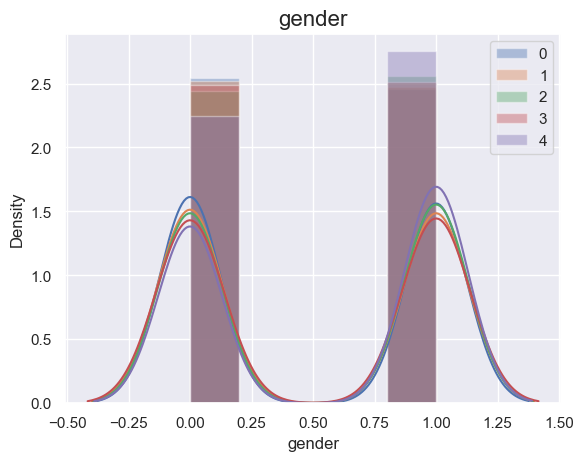

<AxesSubplot: xlabel='near_location', ylabel='Density'>

<AxesSubplot: xlabel='near_location', ylabel='Density'>

<AxesSubplot: xlabel='near_location', ylabel='Density'>

<AxesSubplot: xlabel='near_location', ylabel='Density'>

<AxesSubplot: xlabel='near_location', ylabel='Density'>

Text(0.5, 1.0, 'near_location')

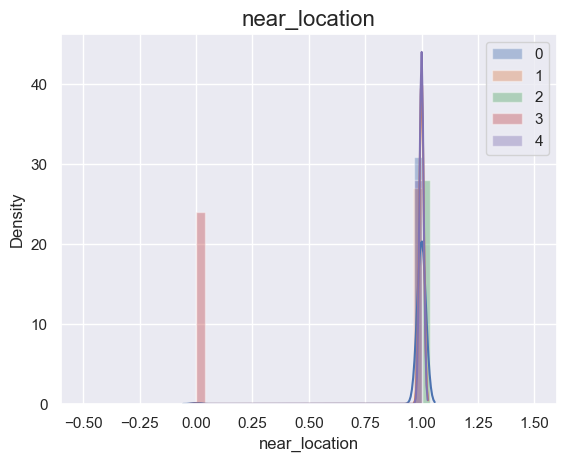

<AxesSubplot: xlabel='partner', ylabel='Density'>

<AxesSubplot: xlabel='partner', ylabel='Density'>

<AxesSubplot: xlabel='partner', ylabel='Density'>

<AxesSubplot: xlabel='partner', ylabel='Density'>

<AxesSubplot: xlabel='partner', ylabel='Density'>

Text(0.5, 1.0, 'partner')

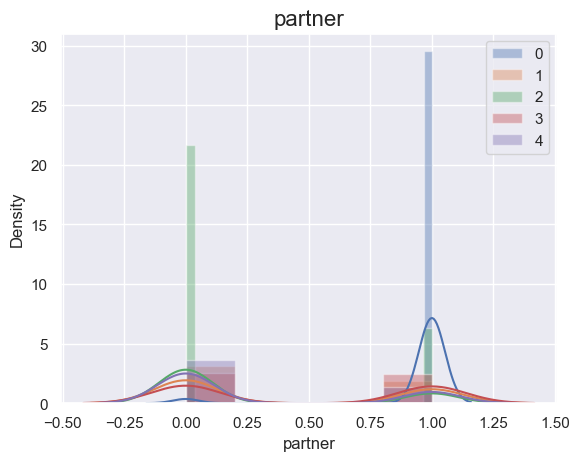

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

<AxesSubplot: xlabel='promo_friends', ylabel='Density'>

Text(0.5, 1.0, 'promo_friends')

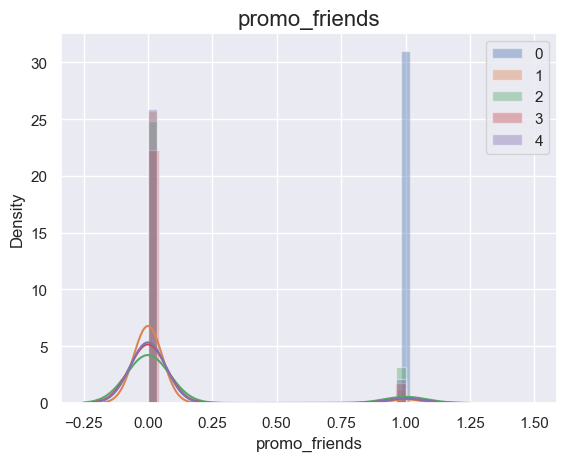

<AxesSubplot: xlabel='phone', ylabel='Density'>

<AxesSubplot: xlabel='phone', ylabel='Density'>

<AxesSubplot: xlabel='phone', ylabel='Density'>

<AxesSubplot: xlabel='phone', ylabel='Density'>

<AxesSubplot: xlabel='phone', ylabel='Density'>

Text(0.5, 1.0, 'phone')

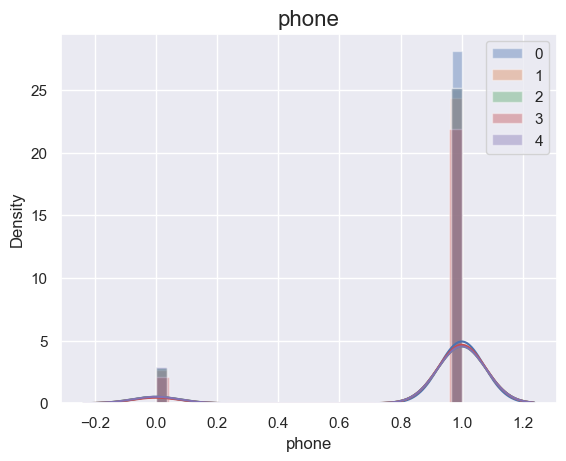

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

<AxesSubplot: xlabel='group_visits', ylabel='Density'>

Text(0.5, 1.0, 'group_visits')

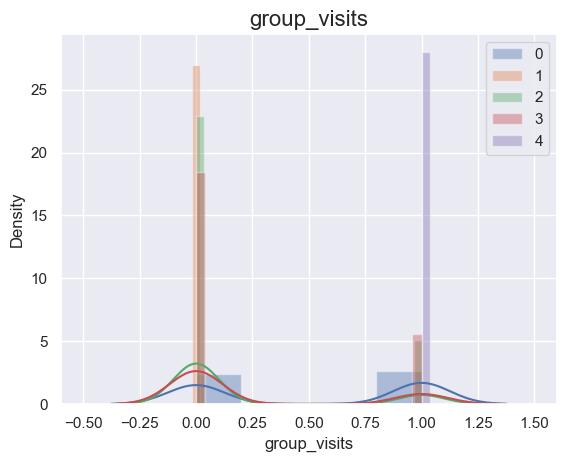

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

Text(0.5, 1.0, 'age')

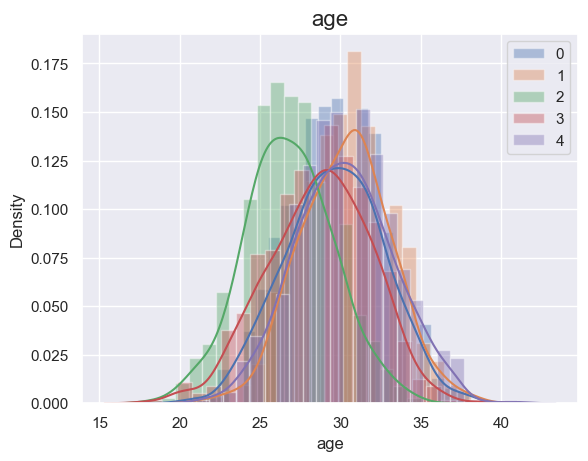

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

<AxesSubplot: xlabel='avg_additional_charges_total', ylabel='Density'>

Text(0.5, 1.0, 'avg_additional_charges_total')

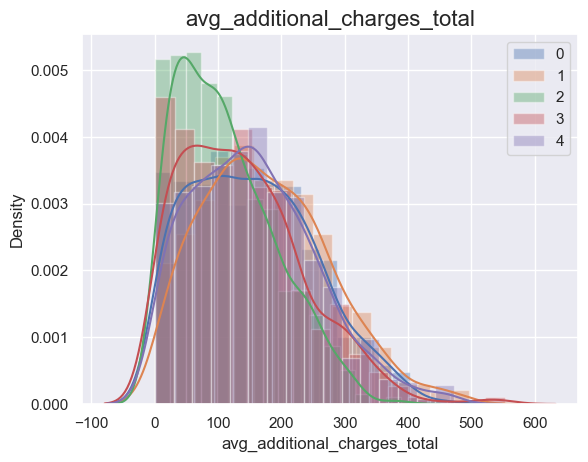

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

<AxesSubplot: xlabel='month_to_end_contract', ylabel='Density'>

Text(0.5, 1.0, 'month_to_end_contract')

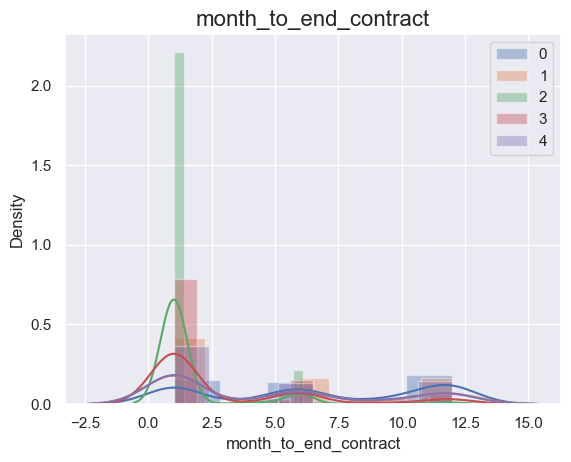

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

<AxesSubplot: xlabel='lifetime', ylabel='Density'>

Text(0.5, 1.0, 'lifetime')

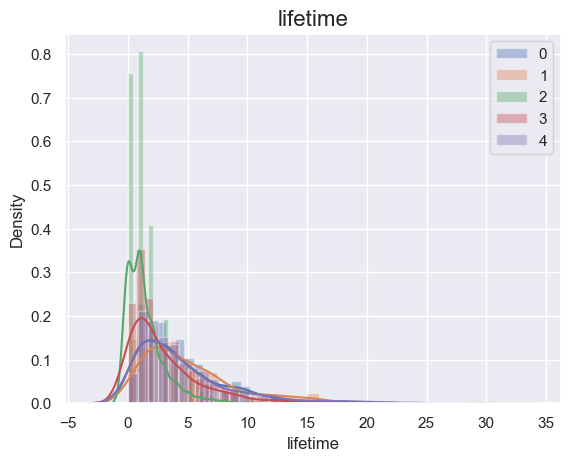

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

<AxesSubplot: xlabel='avg_class_frequency_current_month', ylabel='Density'>

Text(0.5, 1.0, 'avg_class_frequency_current_month')

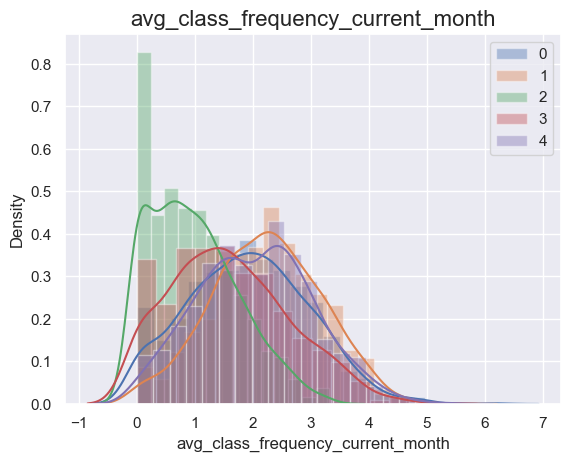

<AxesSubplot: xlabel='cluster_num', ylabel='Density'>

<AxesSubplot: xlabel='cluster_num', ylabel='Density'>

<AxesSubplot: xlabel='cluster_num', ylabel='Density'>

<AxesSubplot: xlabel='cluster_num', ylabel='Density'>

<AxesSubplot: xlabel='cluster_num', ylabel='Density'>

Text(0.5, 1.0, 'cluster_num')

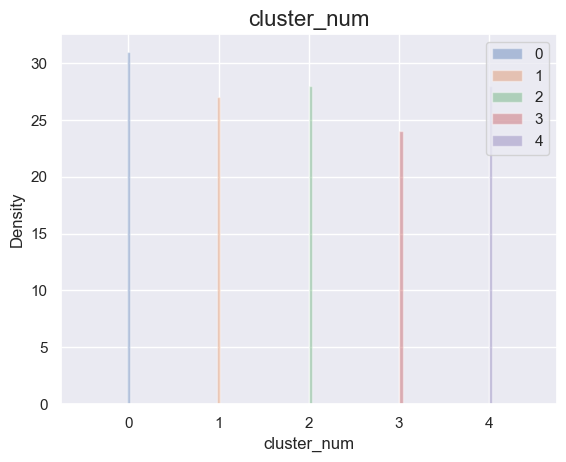

In [52]:
# Here i'm plotting a similar distribution to that i made earlier , only this time in relation to cluster number

# maybe it'll give me a deeper insights \ different prespective of analysis

# using nested loop

for col in gym_nc.drop('churn', axis = 1).columns:
    for i in range(0, 5):
        gym_churn_n = gym_nc.loc[gym_nc['cluster_num'] == i]
        sns.distplot(gym_churn_n[col], label = i)
    plt.title(col, fontsize=16)
    plt.legend()
    plt.show()

It fascinates me to see how a population variable such as **age** presents a normal distribution , 
given a sufficiently large sample.

Indeed , The age curve looks great and smooth. 

We can see the binary pattern between single-gender clusters, the prominence of cluster 1 over higher values along
the X-axis (avg additional charges), and more.

#### Churn rate for each cluster

In [53]:
gym_churn_groups = gym_nc.groupby(['cluster_num'])['churn'].mean()
gym_churn_groups

cluster_num
0    0.108000
1    0.046481
2    0.741294
3    0.400982
4    0.092548
Name: churn, dtype: float64

**Churn Rate**

The **churn rate in Cluster 1 is the lowest** of any other cluster at **0.5%**. 

This cluster is distinguished from others in that it has a higher rate of customer participation in group sessions, 
a greater number of months remaining on the contract, a greater expenditure on related merchandise and services, an older average age, and residence in close proximity to a gym.

In contrast, **cluster 4 demonstrates the highest** churn percentage with **42%** churn. This cluster is characterized
as mono-gender,  absence of a employee discount, and nearby residences.

Not for nothing, **Cluster 3** has members who benefit from the gym's various discounts: registration discount via a member and registration discount for an employee of a partner firm. Not surprisingly, this cluster ranks second in terms of client retention, with just **12%** churn.

We are left with two clusters with comparable churn rates that are distinguished by poor social participation and money spending.

Cluster 1 is made up of members who don't live near the gym and don't attend group sessions. 
Members in Cluster 3 live in the area but avoid spending money on products. 

It's possible that distance plays a factor, with intermediate factors in the middle causing churn.

I'll explain. Let's imagine 2 gym members:

One lives close by , but his friends are training in a a remote gym.

The other lives far away, but lacks of social skills or simply friends work out in other gyms, 
so it turns out that he works out alone.

**We can try to imagine diferent senarios of the process of churn:**

**Member 1:**  I live close -> coming to the gym -> I work out -> I spend less time at the gym since I talk less \ lack of social skills \ My friends ain't here -> less time at the gym = less chance of eating and drinking there \ why spending money? i live nearby -> I should shorten my workout so i can meet my friends -> why won't i move to my friends gym -> churn.

**Member 2:** I live far -> longer time to come here -> I work out -> I need to hurry so i could catch my bus -> less time
for social experiences -> why should I eat here ? i'll eat with my buddies -> end excersie -> back home -> churn as the
the social presure decreases.

What I'm trying to suggest is that the geographical variable (distance from the gym) may be intensifying some exercisers' perception of social isolation, whether they lack social skills or not. 
This sensation of isolation and separation from a person's social center may incubate inside him, causing transitory 
pain that results in the "better" situations in reduction of training ,
and in the worst circumstances in churn.

<a id="step5"></a>

#### Conclusions & Recommendations


Our main conclusion is that the logisticRegression model predicted churn better. The classification and 
clustering of consumers resulted in five distinct sorts of clients. My suggestions are as follows:

1 . The gym should invest in enhancing subscriber involvement in the gym activities. Send SMS messages, for example, 
reminding them of lesson X in Time Y.

2 . Attempt to promote member involvement among themselves: for example, create a Facebook page for gym trainees 
where they may talk and exchange images and experiences.

3 . Enhancing the relationship with remote trainees while updating the system of discounts and benefits, 
such as by offering a special registration discount to distant trainees: 50% of the cost of using 
public transportation (a benefit can be presented in a variety of creative ways).

4 . Giving the customers who are involved whatsoever priority. You can make a card that accumulates points for each purchase of a gym item or service.